# 4.0 Modeling
The purpose of this notebook is to investigate our proposed clustering models for our data including a basic KMeans model, a model that will interpret the data using a large language model before passing it to a KMeans model, and a KPrototypes model and select a model to cluster our data with.

In [5]:
import pandas as pd

import importlib
import sys

# setting path
sys.path.append('..')
# importing
from src.models import modeling
importlib.reload(modeling);

## 1. Load Data

In [2]:
kmeans_all = pd.read_csv('../data/processed/kmeans_all_data.csv')
kmeans_high = pd.read_csv('../data/processed/kmeans_high_school.csv')

llm_all = pd.read_csv('../data/processed/llm_kmeans_all_data.csv')
llm_high = pd.read_csv('../data/processed/llm_kmeans_high_school.csv')

kprototypes_all = pd.read_csv('../data/processed/no_outliers_kmeans_all_data.csv')
kprototypes_high = pd.read_csv('../data/processed/no_outliers_kmeans_high_school.csv')

llm_all_no_outliers = pd.read_csv('../data/processed/no_outliers_llm_kmeans_all_data.csv')
llm_high_no_outliers = pd.read_csv('../data/processed/no_outliers_llm_kmeans_high_school.csv')

## 2. Choosing the Right K
In this section, we will look at elbow plots and silhoutte scores for different values of k across each model

In [6]:
# KMeans
kmeans_all_modeler = modeling.KMeansSelector(kmeans_all)
kmeans_high_modeler = modeling.KMeansSelector(kmeans_high)
# LLM
llm_all_modeler = modeling.KMeansSelector(llm_all)
llm_high_modeler = modeling.KMeansSelector(llm_high)
# Kprototypes
kpro_all_selector = modeling.KPrototypesModelSelector(kprototypes_all)
kpro_high_selector = modeling.KPrototypesModelSelector(kprototypes_high, high_school=True)

### 2.1 KMeans

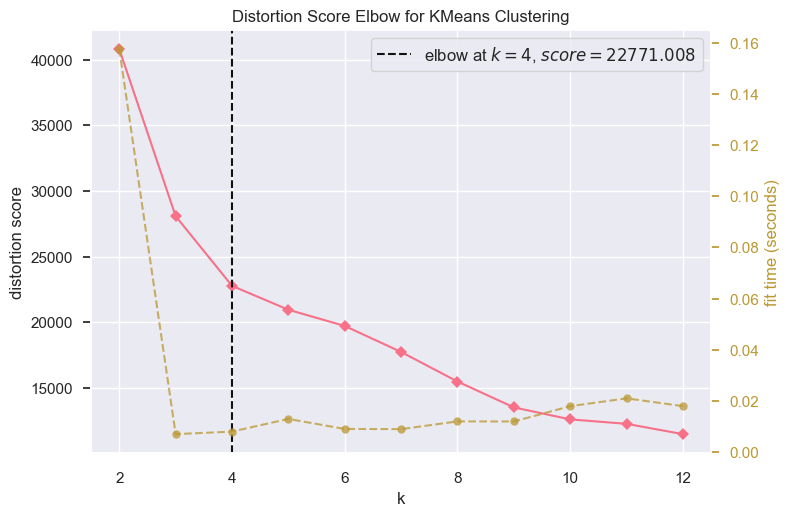

In [4]:
kmeans_all_modeler.show_elbow()

For n_clusters=3 The average silhouette score is 0.40533325588824687


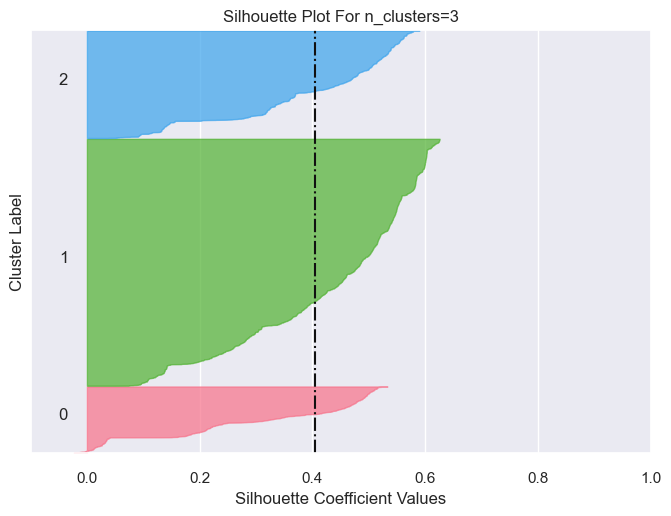

For n_clusters=4 The average silhouette score is 0.36101707637381414


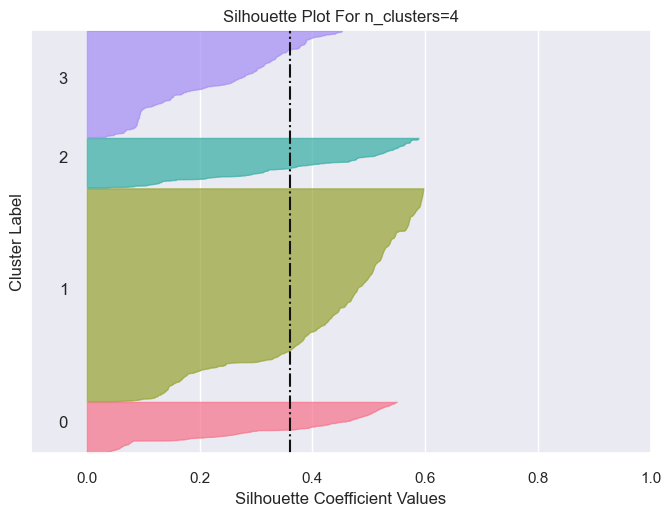

For n_clusters=5 The average silhouette score is 0.33122487952956514


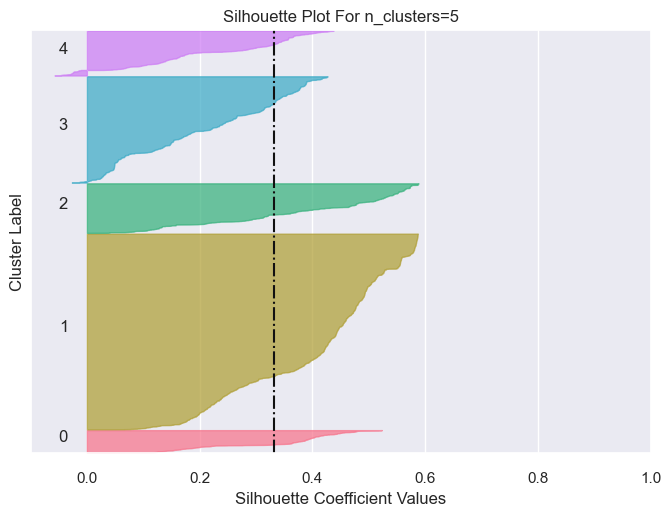

For n_clusters=6 The average silhouette score is 0.3044399445698407


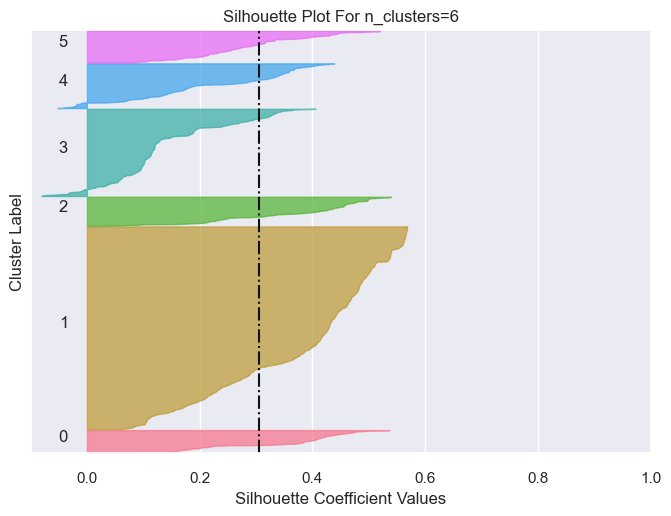

In [5]:
kmeans_all_modeler.show_silhouettes(3,7)

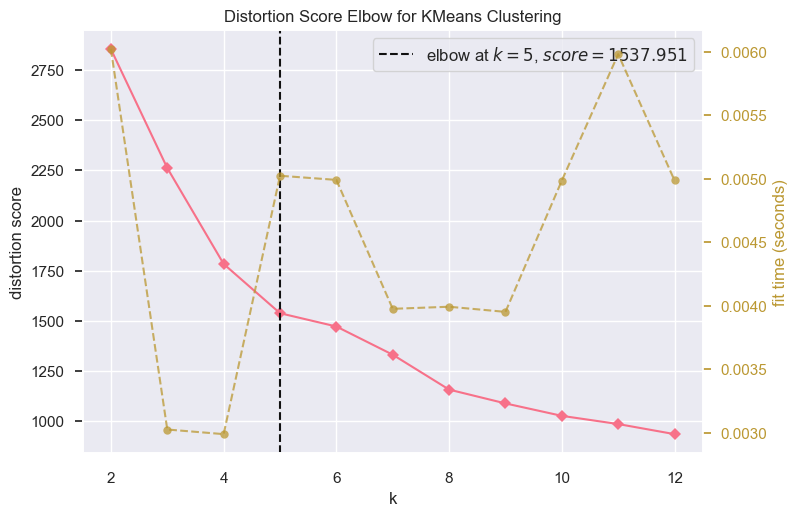

In [6]:
kmeans_high_modeler.show_elbow()

For n_clusters=3 The average silhouette score is 0.2643410165659297


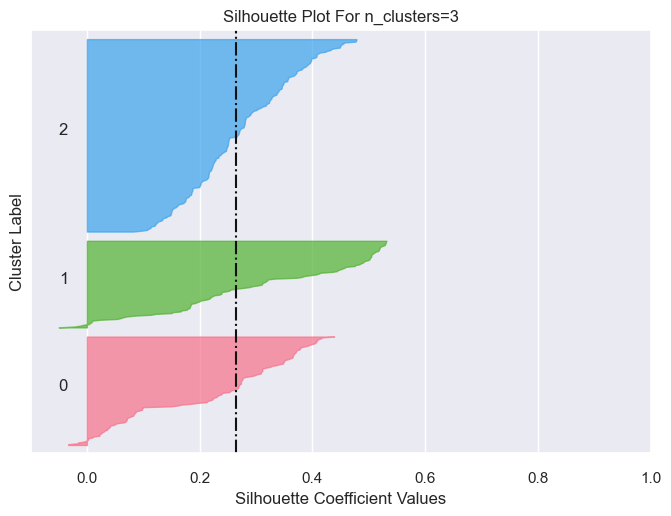

For n_clusters=4 The average silhouette score is 0.2975434178444452


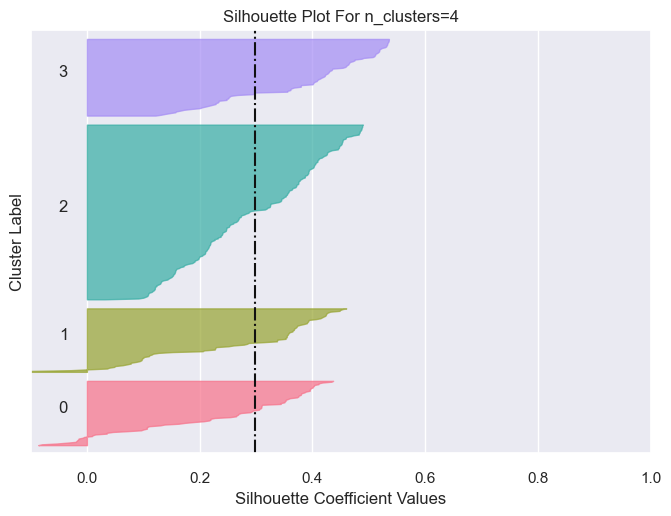

For n_clusters=5 The average silhouette score is 0.3137354251860567


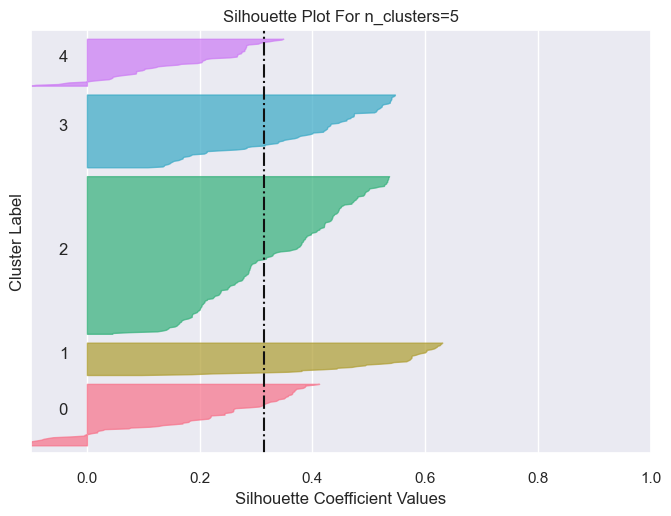

For n_clusters=6 The average silhouette score is 0.30726403650715794


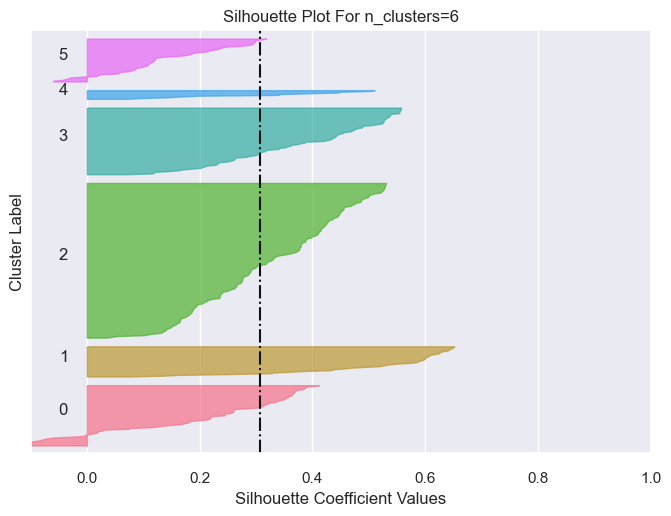

For n_clusters=7 The average silhouette score is 0.2933936602571354


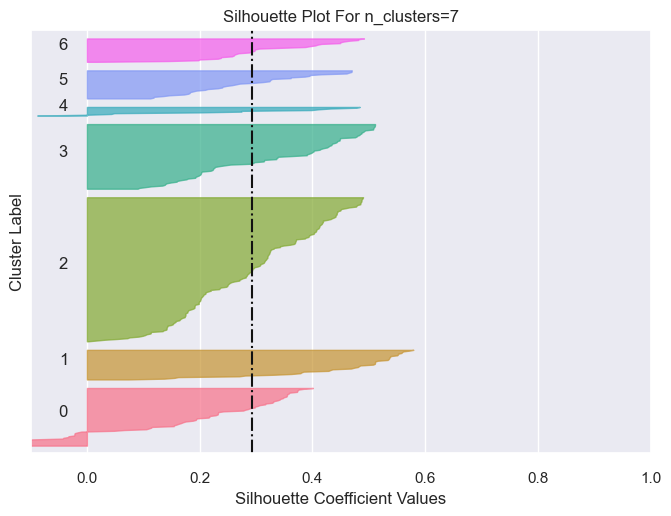

For n_clusters=8 The average silhouette score is 0.28406266909892797


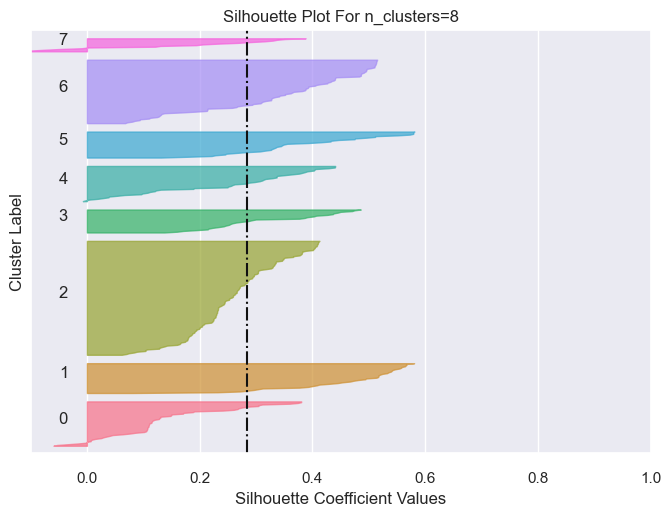

In [7]:
kmeans_high_modeler.show_silhouettes(3,9)

We can confidently conclude that a value of 4 for both the all data and the high school data is a good choice for k. At this value, we can see an elbow in the distortion and silhouette scores as well as fairly even class distribution among assigned labels

### 2.2 LLM + KMeans

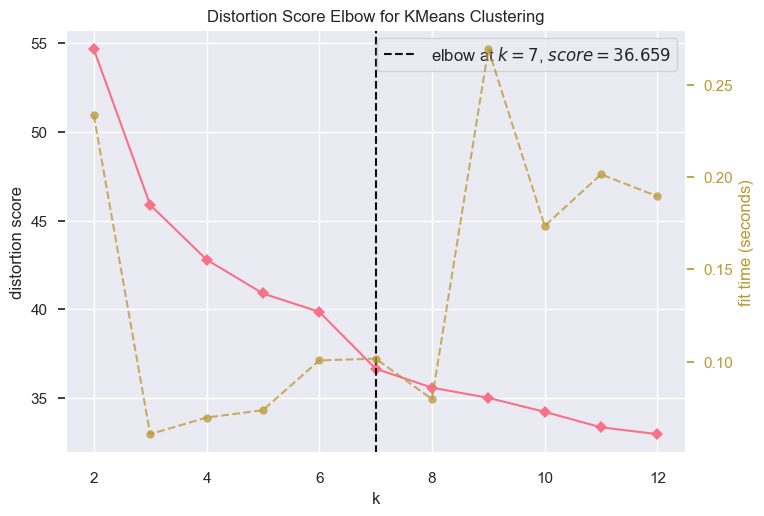

In [7]:
llm_all_modeler.show_elbow(save_filename='../reports/figures/all_elbow.png')

For n_clusters=3 The average silhouette score is 0.23770747967966677


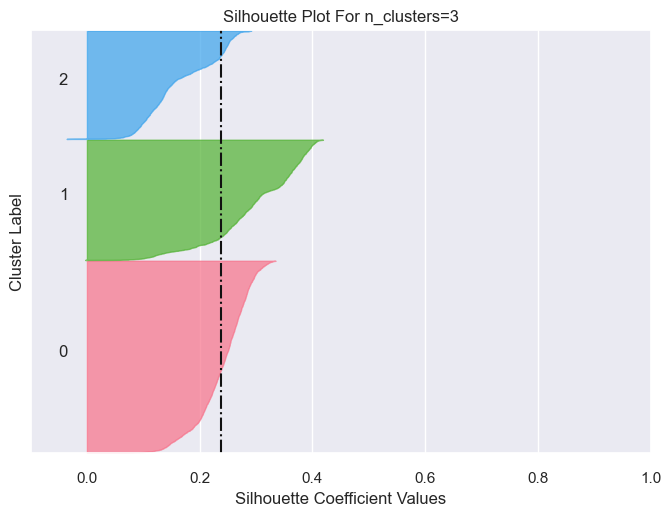

For n_clusters=4 The average silhouette score is 0.18534432993191138


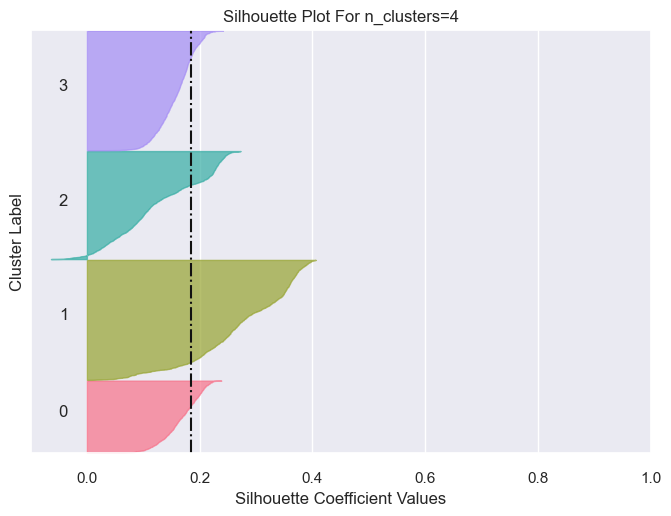

For n_clusters=5 The average silhouette score is 0.14662700411779783


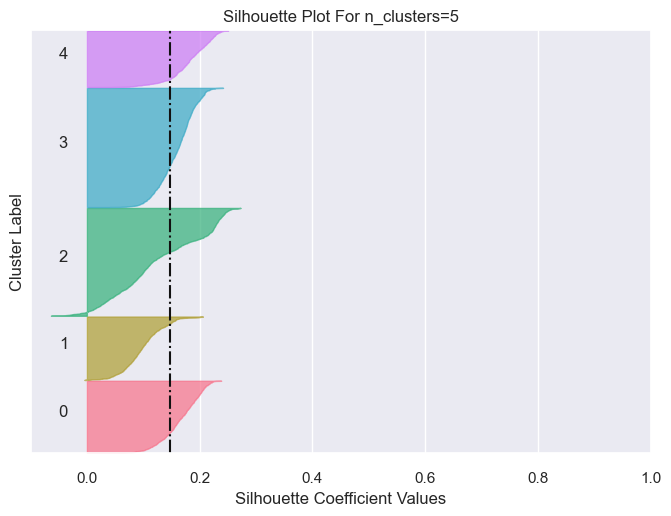

For n_clusters=6 The average silhouette score is 0.118103570474033


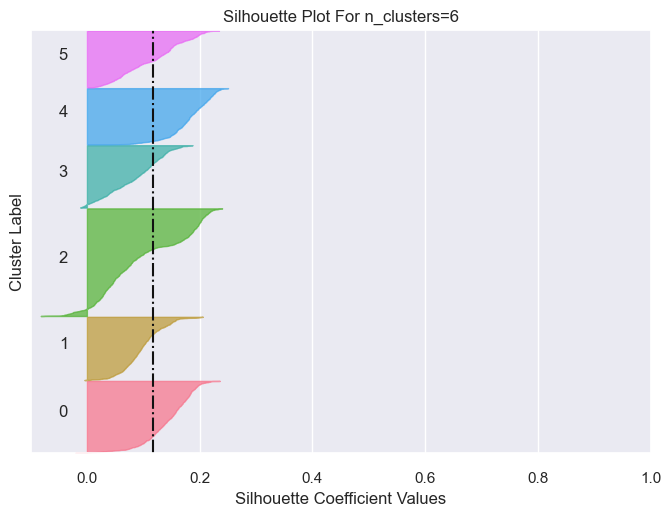

For n_clusters=7 The average silhouette score is 0.1396675024737334


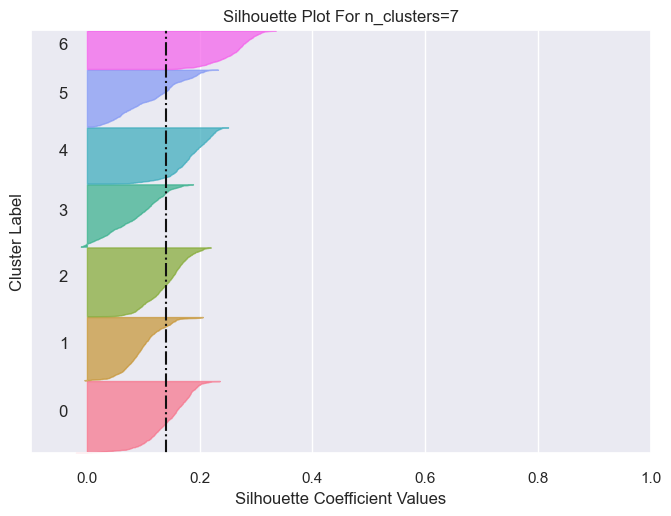

For n_clusters=8 The average silhouette score is 0.16805051048905015


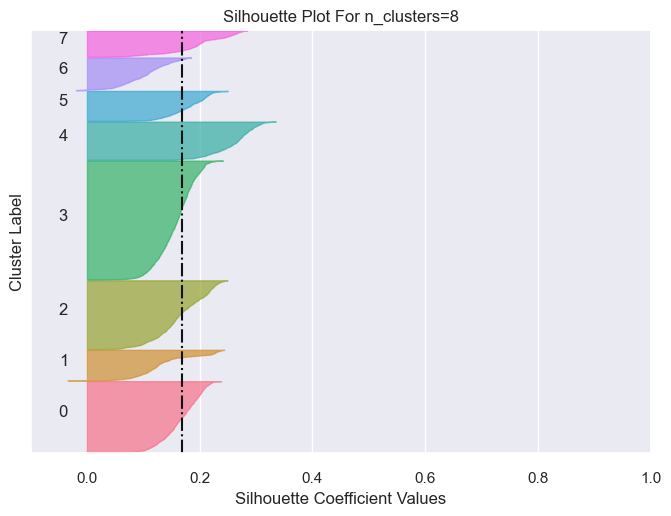

For n_clusters=9 The average silhouette score is 0.149290716411257


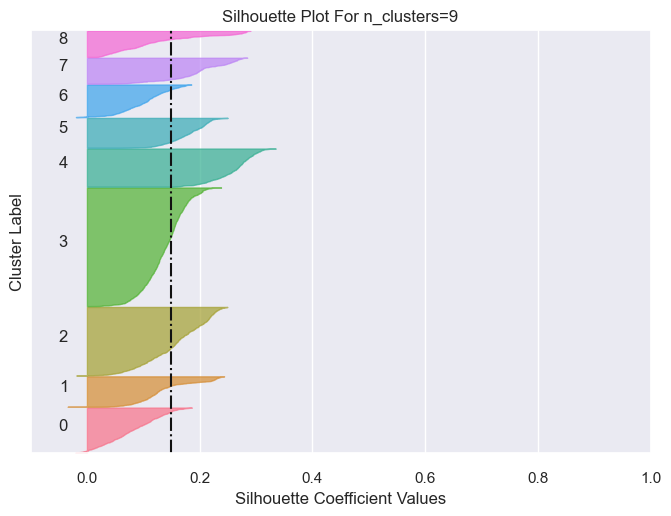

In [9]:
llm_all_modeler.show_silhouettes(3,10)

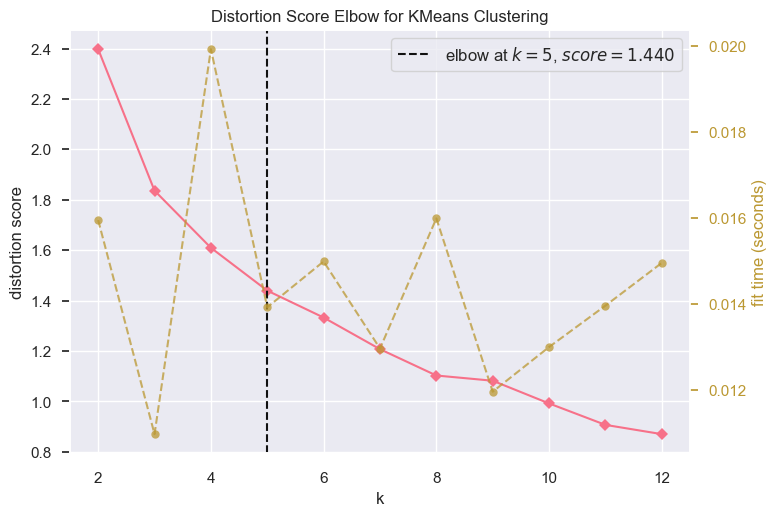

In [8]:
llm_high_modeler.show_elbow(save_filename='../reports/figures/high_elbow.png')

For n_clusters=2 The average silhouette score is 0.2515917981942868


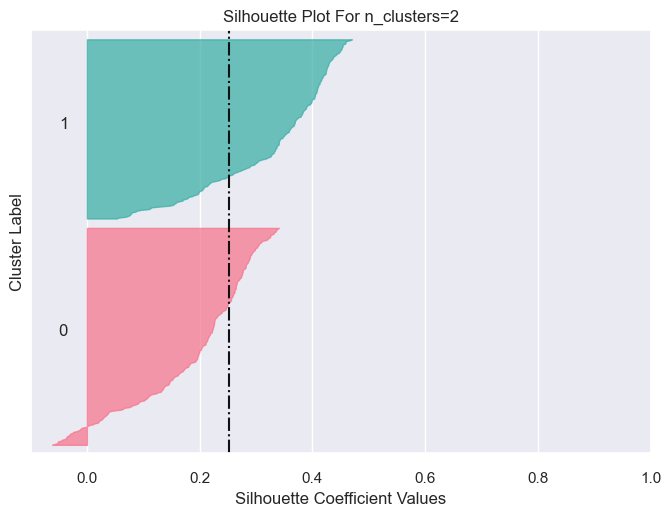

For n_clusters=3 The average silhouette score is 0.27575057733682384


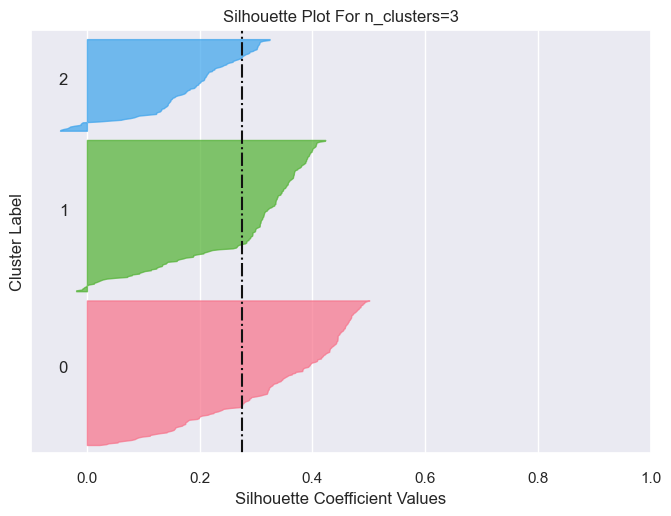

For n_clusters=4 The average silhouette score is 0.2677404859477881


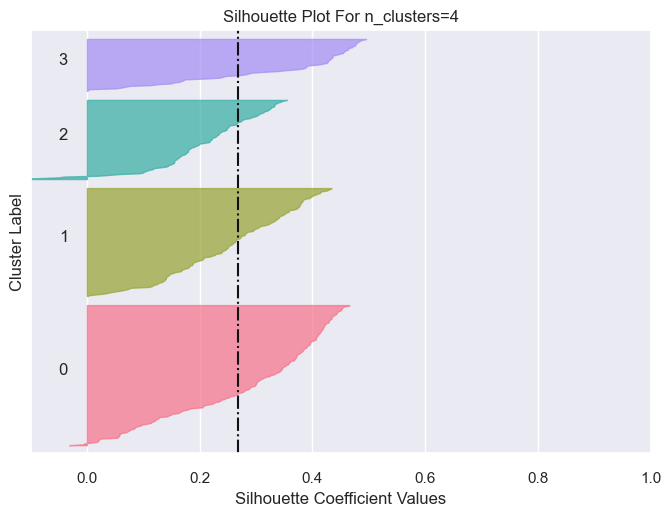

For n_clusters=5 The average silhouette score is 0.2870448100476948


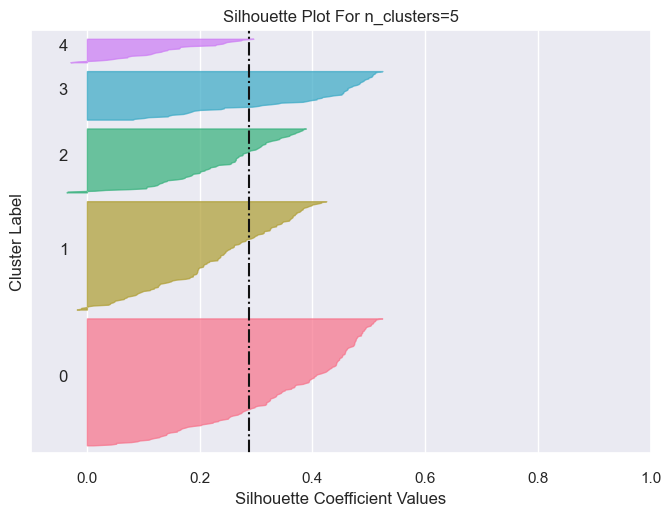

For n_clusters=6 The average silhouette score is 0.2324398163714213


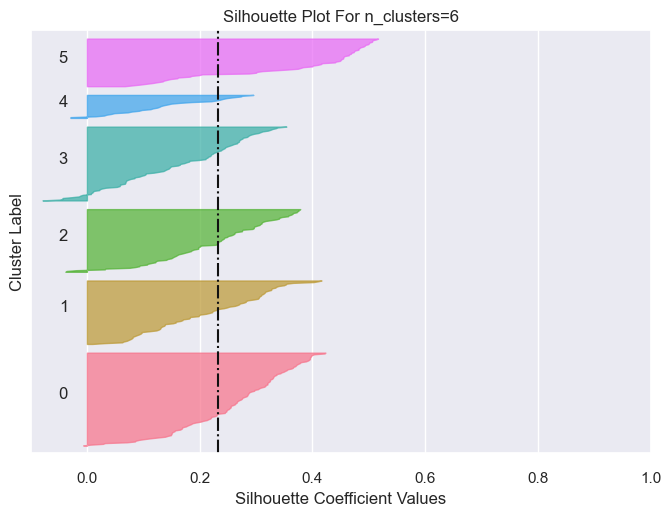

For n_clusters=7 The average silhouette score is 0.24044032713568803


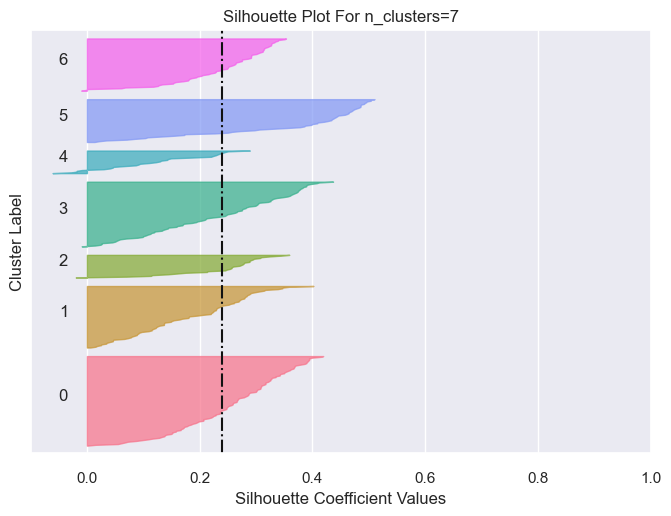

In [11]:
llm_high_modeler.show_silhouettes(2,8)

Similar to the simple KMeans model, $k = 6$ is suggested for the all_data model. However, for the high school dataset, we observe something different. The elbow plot recommends $k = 6$, but from the silhouette plots, we see negative silhouettes at $k = 4$ in addition to highly imbalanced class sizes. Therefore we have determine that $k = 3$ is the best choice for this model

### 2.3 KPrototypes
Using the KPrototypes model implemented by KModes, we will look at its elbow plots

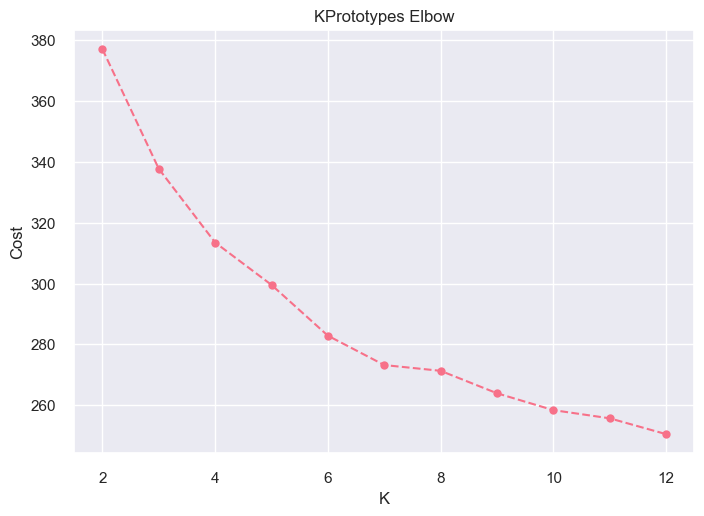

In [12]:
kpro_all_selector.show_elbow()

For n_clusters=3 The average silhouette score is 0.0951734408736229


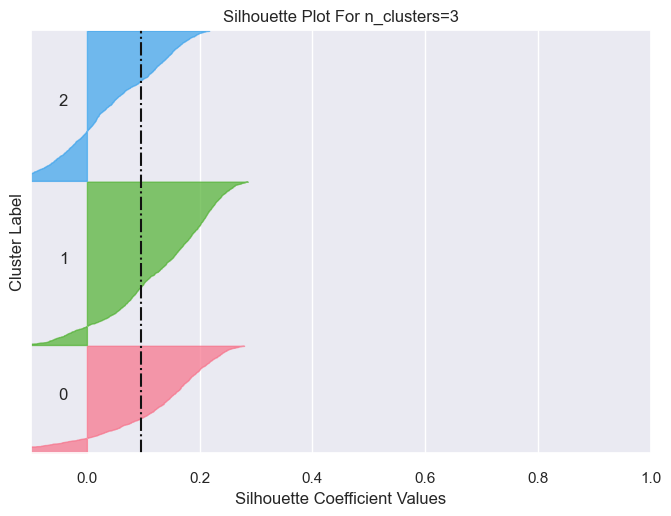

For n_clusters=4 The average silhouette score is 0.0744611993432045


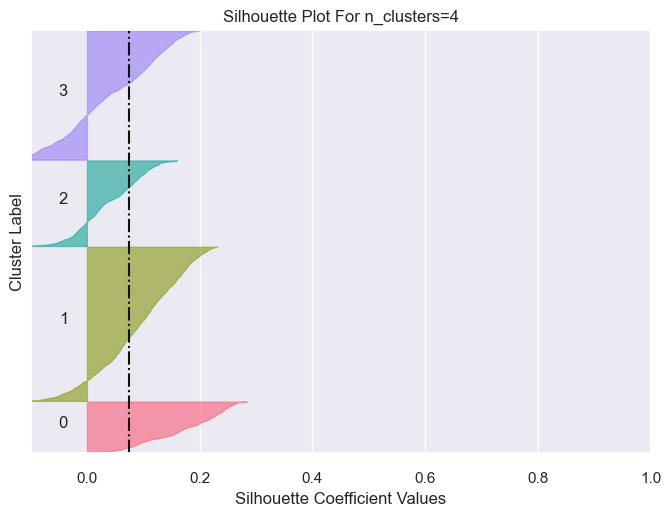

For n_clusters=5 The average silhouette score is 0.07018782943487167


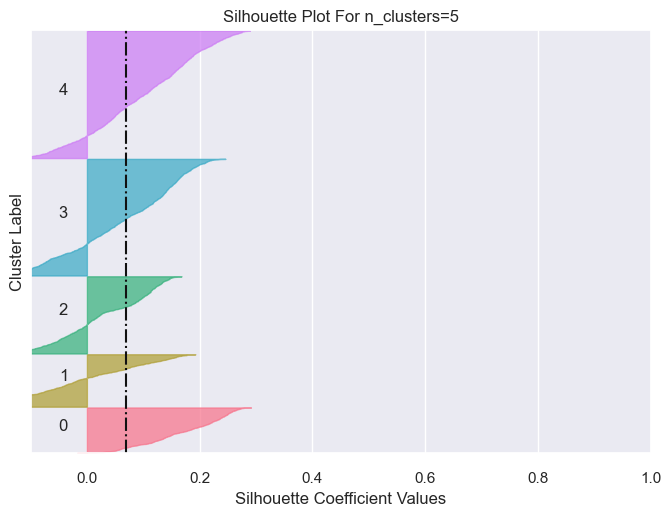

For n_clusters=6 The average silhouette score is 0.0796656683087349


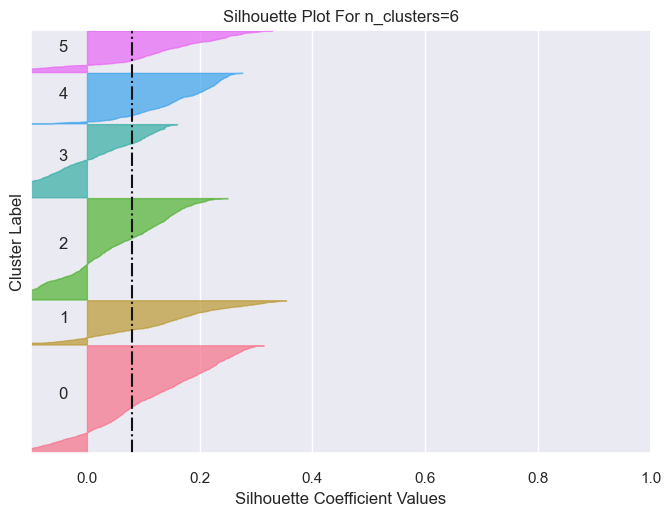

For n_clusters=7 The average silhouette score is 0.06315125524997711


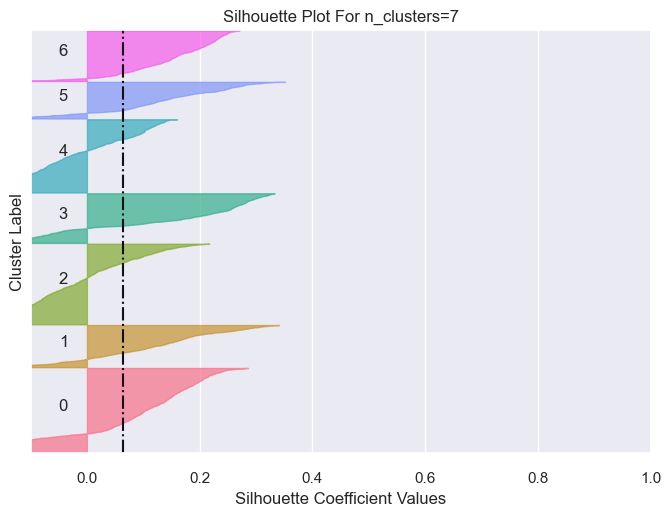

For n_clusters=8 The average silhouette score is 0.06140616536140442


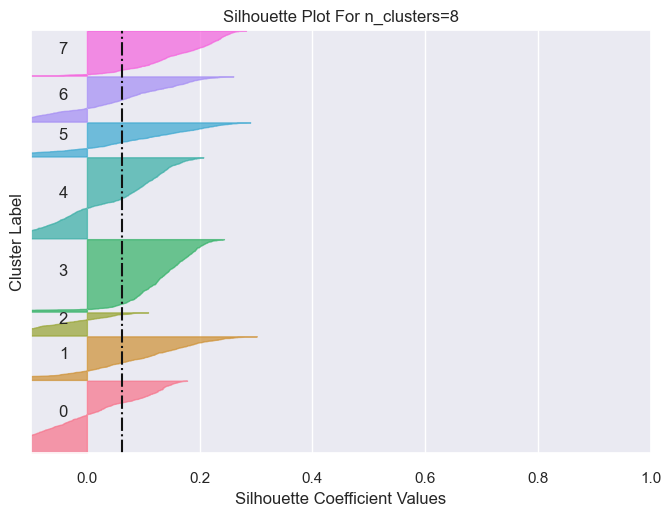

In [58]:
kpro_all_selector.show_silhouettes(3,9)

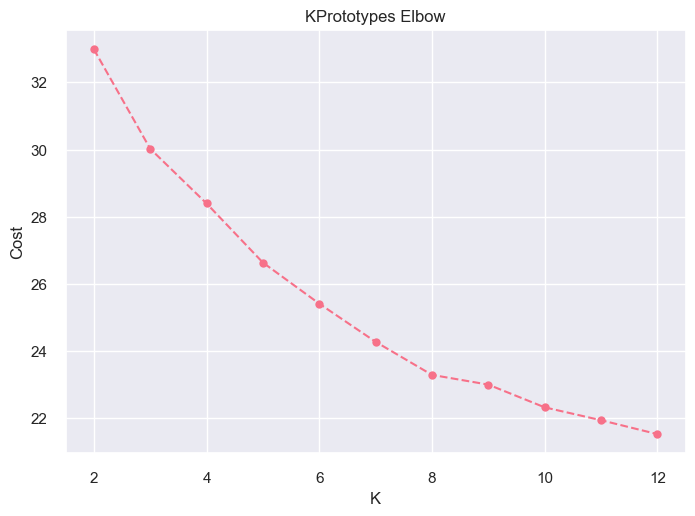

In [14]:
kpro_high_selector.show_elbow()

For n_clusters=3 The average silhouette score is 0.1225769966840744


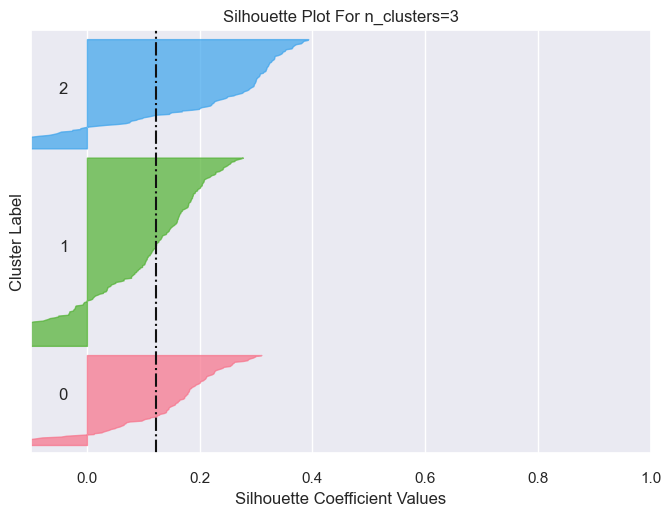

For n_clusters=4 The average silhouette score is 0.07807445526123047


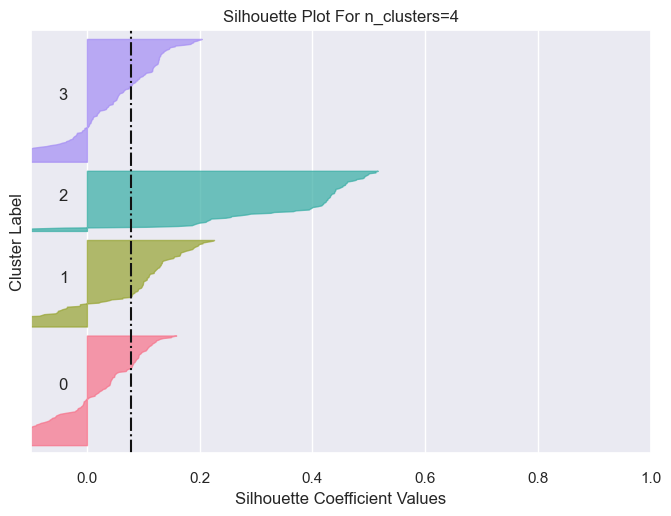

For n_clusters=5 The average silhouette score is 0.07931048423051834


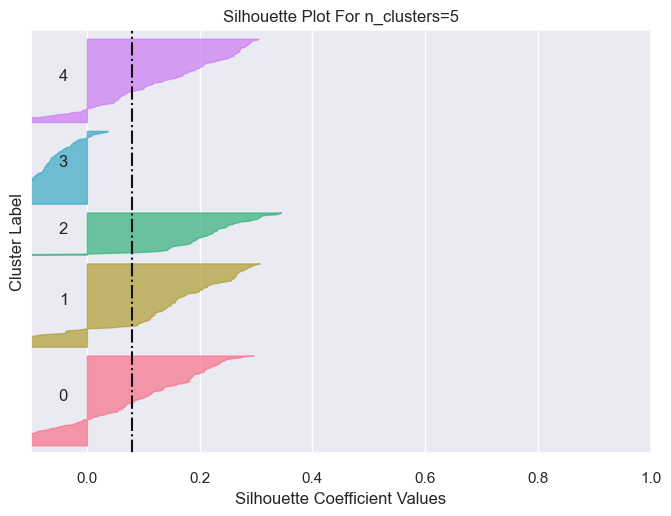

For n_clusters=6 The average silhouette score is 0.07692483067512512


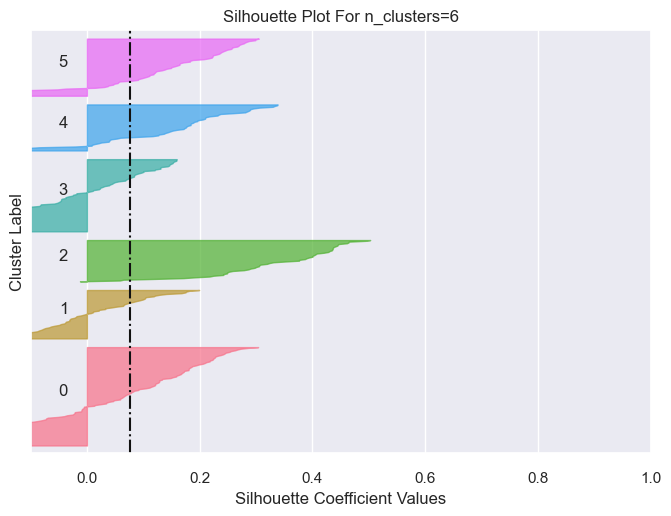

For n_clusters=7 The average silhouette score is 0.06178890913724899


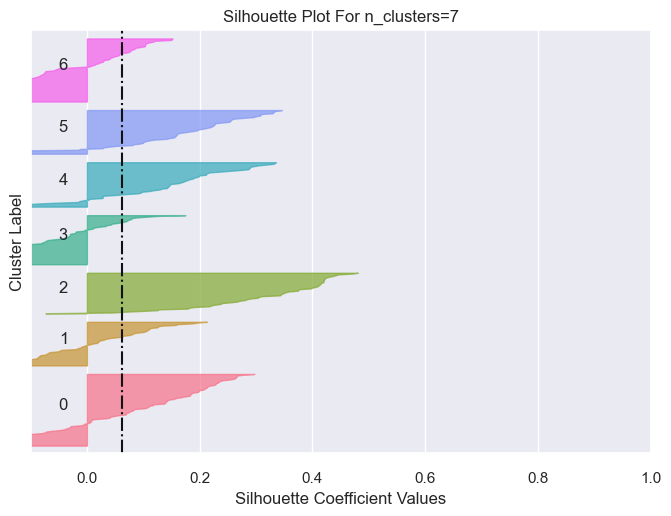

In [15]:
kpro_high_selector.show_silhouettes(3, 8)

The Kprototypes models are in agreement with the KMeans models that $k=4$ is the best choice

## 3. Evaluating Models

In [10]:
# 4
all_n_clusters = 7
# Load Models
# KMeans
all_model = modeling.KMeansModel(kmeans_all, all_n_clusters)
# LLM KMeans
llm_all_model = modeling.KMeansModel(llm_all, all_n_clusters)
# KPrototypes
kpro_all_model = modeling.KPrototypesModel(kprototypes_all, all_n_clusters)

# Fit and Predict
# KMeans
all_model.fit_predict()
# LLM KMeans
llm_all_model.fit_predict()
# KPrototypes
kpro_all_model.fit_predict()

In [11]:
high_n_clusters = 5

high_model = modeling.KMeansModel(kmeans_high, high_n_clusters)
llm_high_model = modeling.KMeansModel(llm_high, high_n_clusters)
kpro_high_model = modeling.KPrototypesModel(kprototypes_high, high_n_clusters, high_school=True)

high_model.fit_predict()
llm_high_model.fit_predict()
kpro_high_model.fit_predict()

### 3.1 Metrics

#### A. KMeans

In [60]:
all_model.evaluate_model()

Davies Bouldin Score: 1.0023756262691788
Calinksi Score: 4804.919494846347
Silhouette Score: 0.36101707637381414


In [19]:
high_model.evaluate_model()

Davies Bouldin Score: 1.1201625823793087
Calinksi Score: 282.6405167247651
Silhouette Score: 0.3137354251860567


#### B. LLM + KMeans

In [61]:
llm_all_model.evaluate_model()

Davies Bouldin Score: 1.855411012758902
Calinksi Score: 1355.4603662520826
Silhouette Score: 0.18534432993191138


In [21]:
llm_high_model.evaluate_model()

Davies Bouldin Score: 1.310557311992453
Calinksi Score: 144.57173715873714
Silhouette Score: 0.2870448100476948


Based solely on metrics the KMeans model seems to outperform the LLM + KMeans model with the dataset containing all schools. With the high school dataset, they are comprable.

In [62]:
model_names = ('KMeans', 'LLM', 'KPrototypes')
all_models = (all_model, llm_all_model, kpro_all_model)
high_models = (high_model, llm_high_model, kpro_high_model)

In [63]:
modeling.show_adj_rand_score_mat(all_models, model_names)

,KMeans,LLM,KPrototypes
KMeans,1.00000,0.000000,0.0
LLM,-0.00140,1.000000,0.0
KPrototypes,-0.00039,0.000926,1.0


In [24]:
modeling.show_adj_rand_score_mat(high_models, model_names)

,KMeans,LLM,KPrototypes
KMeans,1.000000,0.000000,0.0
LLM,0.021432,1.000000,0.0
KPrototypes,0.036243,0.010497,1.0


According to the adjusted rand score, we can see that each model chooses a unique clustering of the data with the most similar being between the KMeans and KPrototypes models of the high school dataset 

### 3.2 Feature Importances
In this section, we will use a LGBM classifier to classify the clusters using the original dataset in order to determine the relative feature importances necessary for that classification

#### A. KMeans

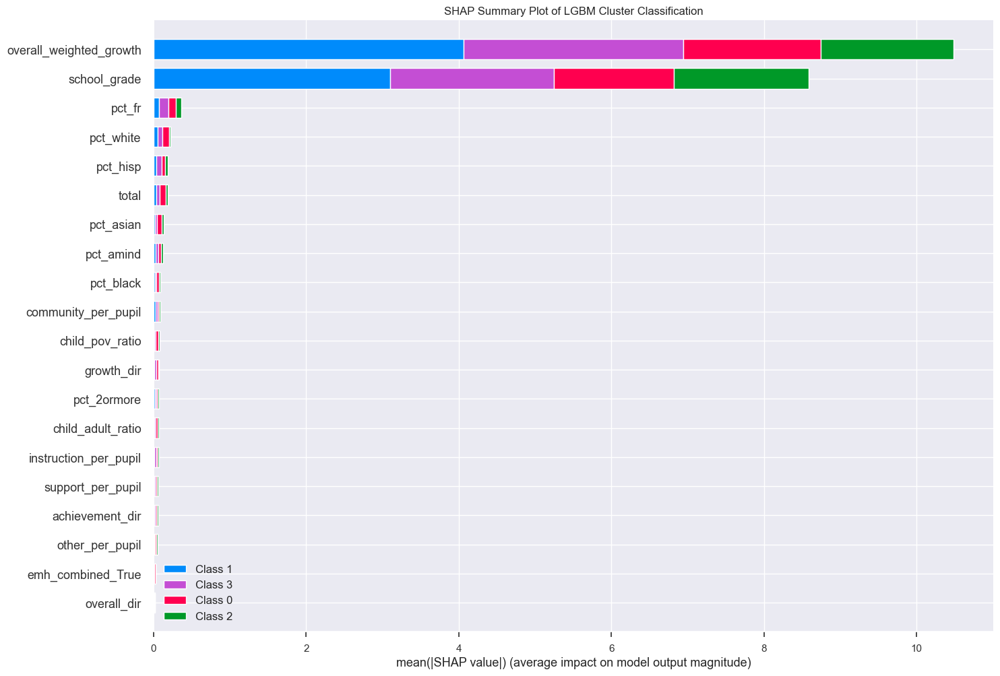

In [64]:
all_model.show_feature_importance()

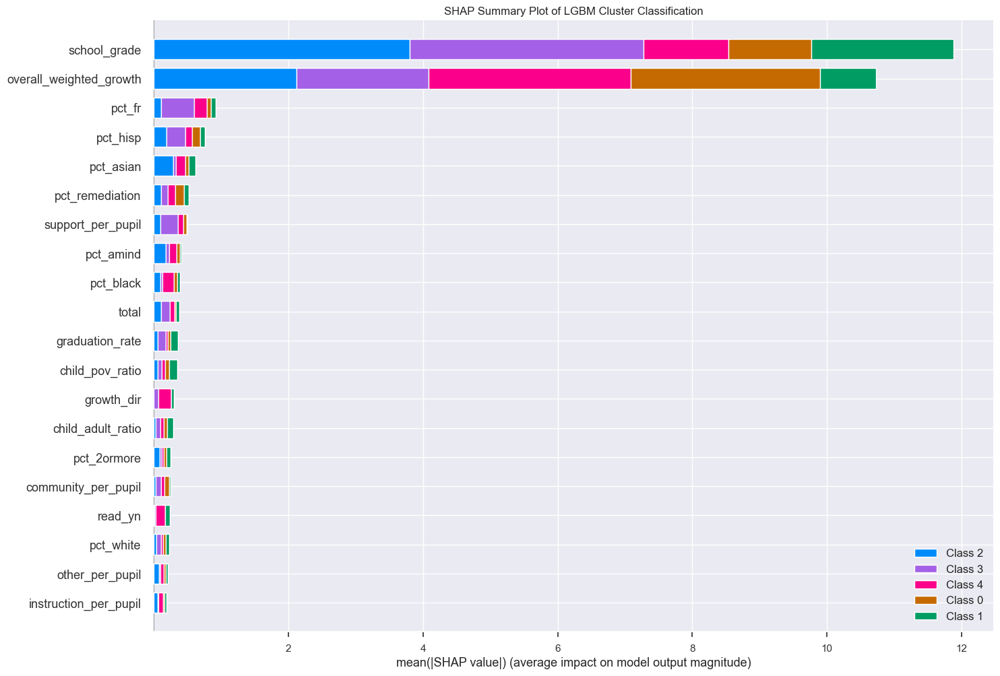

In [26]:
high_model.show_feature_importance()

It seems like the simple KMeans model is only making class distinctions based off of school grade. There is not any deeper analaysis into what is going on

#### B. LLM + KMeans

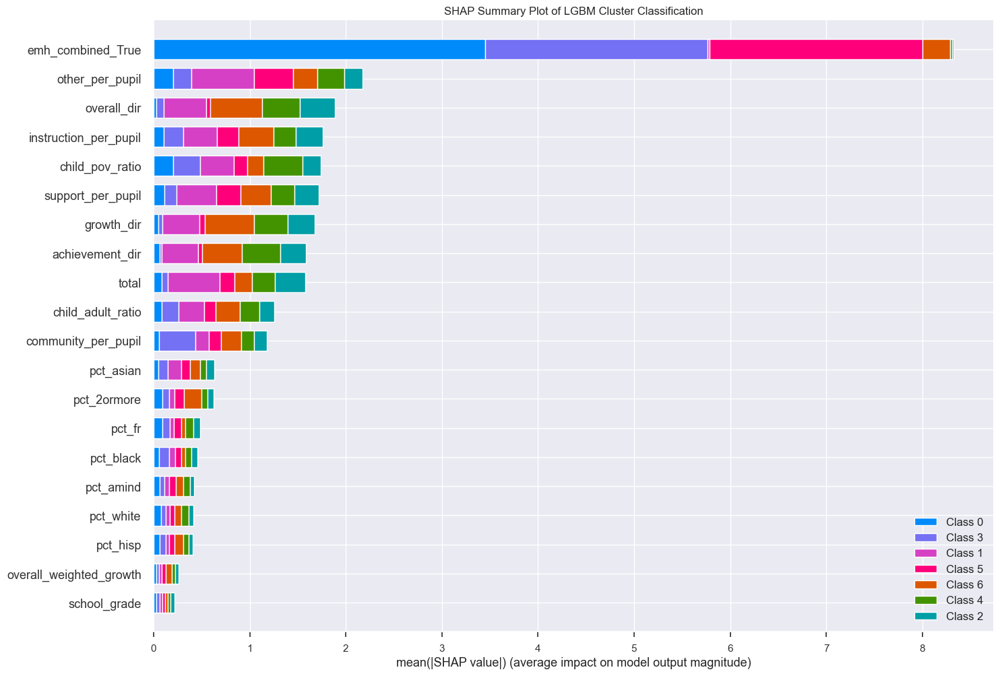

In [12]:
llm_all_model.show_feature_importance(llm_all_no_outliers.drop(['unique_id', 'year'], axis=1), save_filename='../reports/figures/all_shap.png')

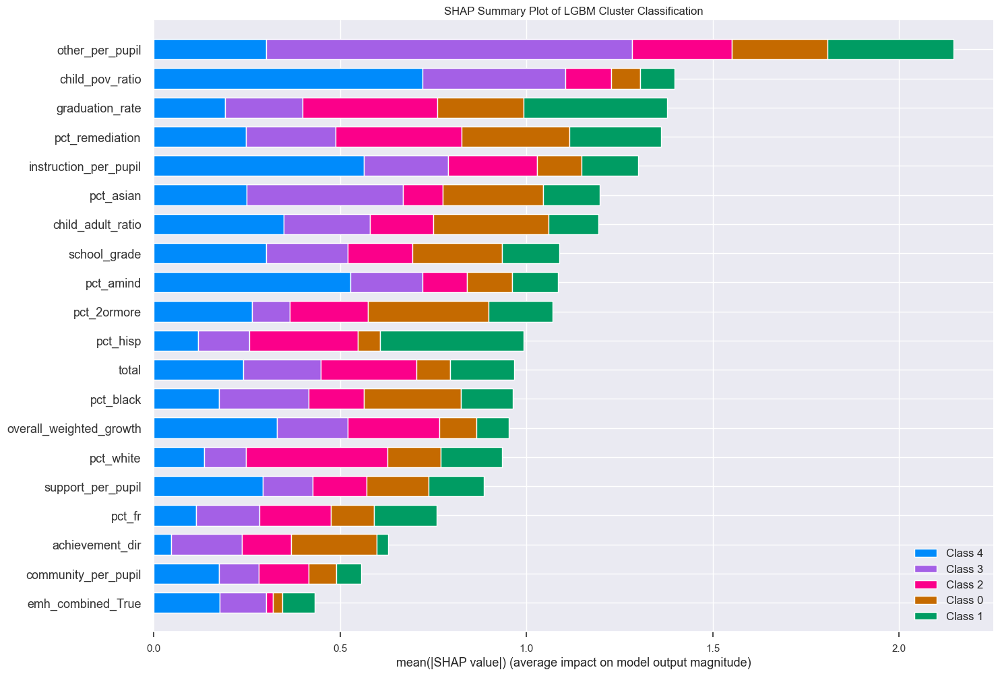

In [13]:
llm_high_model.show_feature_importance(llm_high_no_outliers.drop(['unique_id', 'year'], axis=1), save_filename='../reports/figures/high_shap.png')

The LLM + KMeans models take more features into consideration where school_grade is actually one of the least important features. The model also seems to consider numerical and categorical features equally.

#### C. Kprototypes

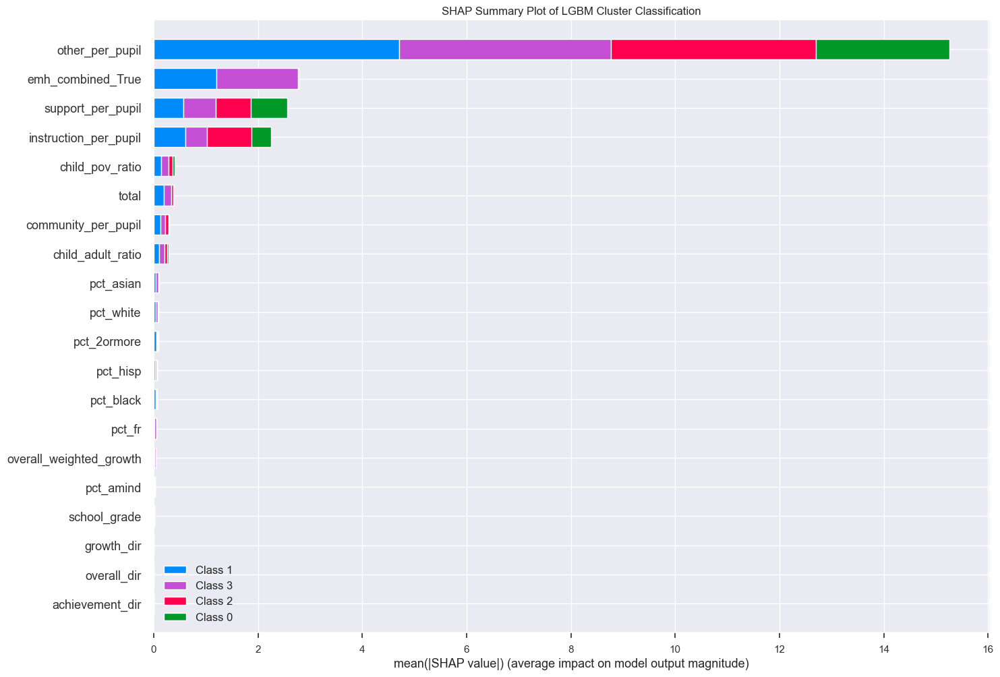

In [66]:
kpro_all_model.show_feature_importance()

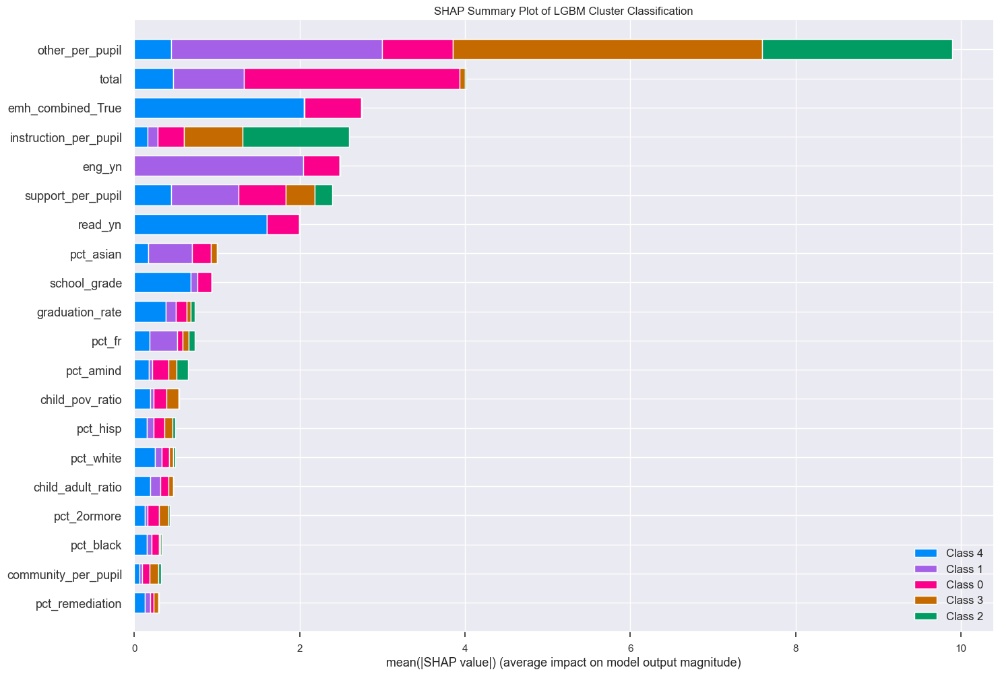

In [30]:
kpro_high_model.show_feature_importance()

The KPrototypes model seems to make a more simple classification.

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              3.720        18.60%                     18.60%
1              2.992        14.96%                     33.56%


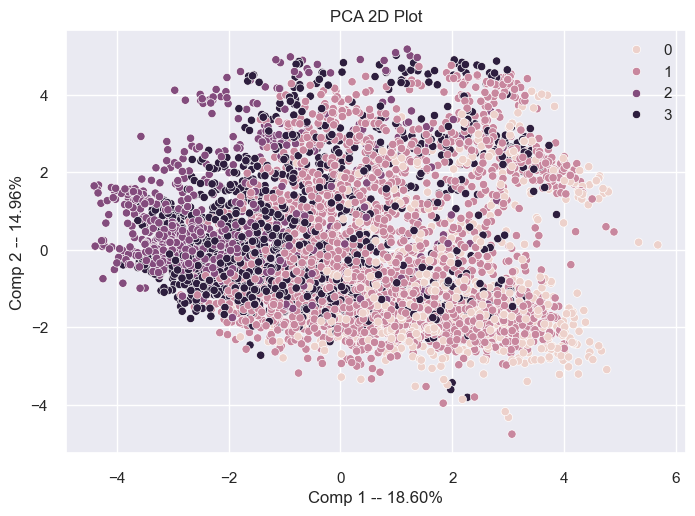

In [67]:
all_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              5.957        22.91%                     22.91%
1              3.656        14.06%                     36.98%


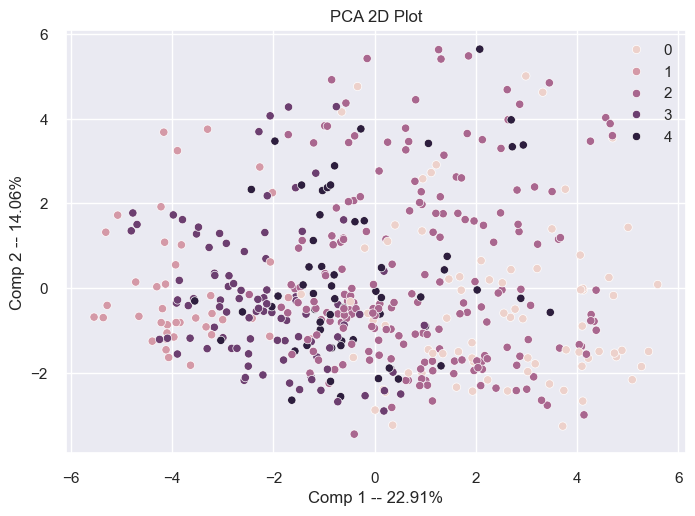

In [32]:
high_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0             83.624        21.78%                     21.78%
1             53.287        13.88%                     35.65%


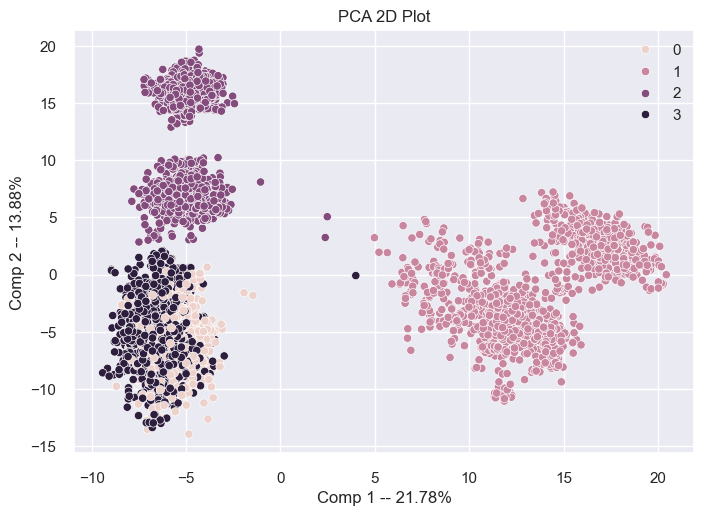

In [68]:
llm_all_model.plot_2d(save_filename='../reports/figures/llm_all_pca_2d.png')

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            106.645        27.77%                     27.77%
1             78.724        20.50%                     48.27%


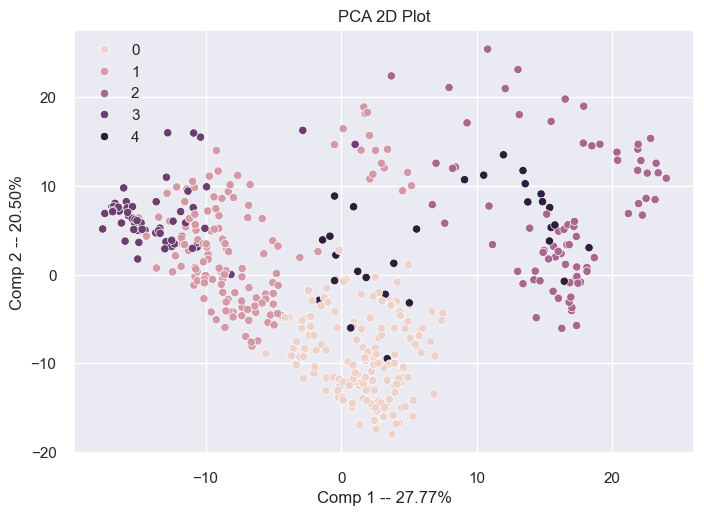

In [34]:
llm_high_model.plot_2d(save_filename='../reports/figures/llm_high_pca_2d.png')

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              3.720        18.60%                     18.60%
1              2.992        14.96%                     33.56%


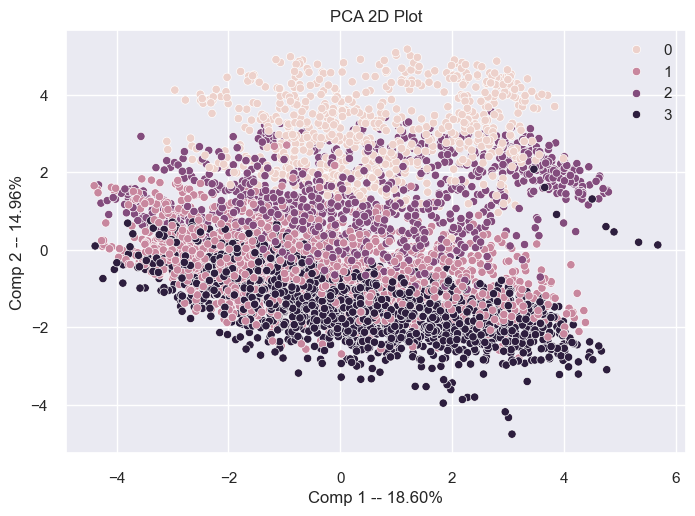

In [69]:
kpro_all_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              5.954        22.90%                     22.90%
1              3.656        14.06%                     36.96%


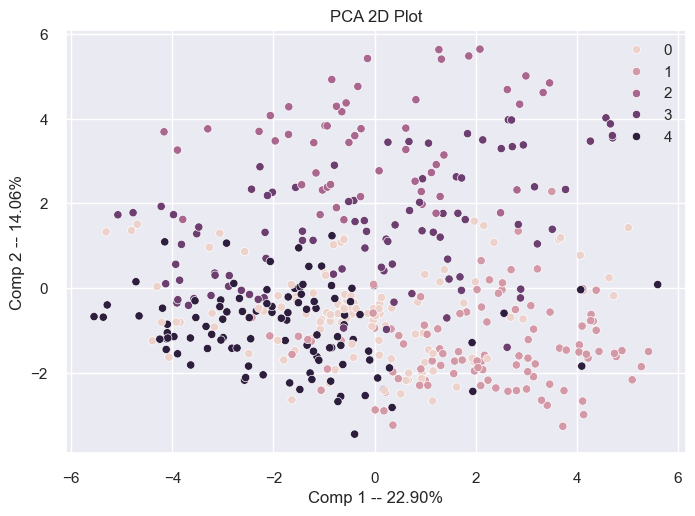

In [36]:
kpro_high_model.plot_2d()

In [70]:
all_model.plot_3d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              3.720        18.60%                     18.60%
1              2.992        14.96%                     33.56%
2              1.945         9.72%                     43.29%


In [38]:
high_model.plot_3d(high_school=True)

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              5.957        22.91%                     22.91%
1              3.656        14.06%                     36.98%
2              2.475         9.52%                     46.50%


In [71]:
llm_all_model.plot_3d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0             83.624        21.78%                     21.78%
1             53.287        13.88%                     35.65%
2             34.657         9.03%                     44.68%


In [40]:
llm_high_model.plot_3d(high_school=True)

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            106.645        27.77%                     27.77%
1             78.724        20.50%                     48.27%
2             37.655         9.81%                     58.08%


In [72]:
kpro_all_model.plot_3d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              3.720        18.60%                     18.60%
1              2.992        14.96%                     33.56%
2              1.946         9.73%                     43.29%


In [42]:
kpro_high_model.plot_3d(high_school=True)

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              5.954        22.90%                     22.90%
1              3.656        14.06%                     36.96%
2              2.475         9.52%                     46.48%


## Conclusion

We have decided to use the LLM + KMeans model. While it does not produce as good of metrics as the KMeans model, its PCA space graph makes a convicing argument for its effectiveness. There are distinct clusters visible in even in 2 dimensions with only approximately 40% of the variance explained. The processing power of the Large Language Model breaks down the data into ways that the simple KMeans cannot extract. While we do acknowledge that there could be a higher performing clustering algorithm to apply to the LLM model such as DBSCAN especially since our dataset is relatively small ~400 features and ~6000 observations, we will continue using KMeans for now.

In [12]:
llm_all_model.save_model('../data/final', 'final_llm_all_7.csv', llm_all_no_outliers)
# llm_high_model.save_model('../data/final', 'final_llm_high.csv', llm_high_no_outliers)